In [1]:
import pandas as pd
from datetime import date
import math
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
from sklearn.preprocessing import MinMaxScaler
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout,LSTM,Activation,RepeatVector
from feature_engine.timeseries.forecasting import LagFeatures, WindowFeatures, ExpandingWindowFeatures
from statsmodels.graphics.tsaplots import plot_acf
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier

In [2]:
df = pd.read_csv('m-hsoldhst6312.txt', sep=' ')

In [3]:
df.head()

,year,mon,hsold,hstart
0,1963,1,42,79.0
1,1963,2,35,89.6
2,1963,3,44,124.8
3,1963,4,52,164.2
4,1963,5,58,172.7


In [3]:
df['Date'] = df['year'].astype(str)+' /'+df['mon'].astype(str)

In [4]:
df_new = df[['Date', 'hsold','hstart']]
df_new

,Date,hsold,hstart
0,1963 /1,42,79.0
1,1963 /2,35,89.6
2,1963 /3,44,124.8
3,1963 /4,52,164.2
4,1963 /5,58,172.7
...,...,...,...
590,2012 /3,34,58.0
591,2012 /4,34,66.8
592,2012 /5,35,67.8
593,2012 /6,34,74.7


In [5]:
df_new['Date'] = pd.to_datetime(df_new['Date'])
df_new['Date']

C:\Users\User\AppData\Local\Temp\ipykernel_5528\35616042.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new['Date'] = pd.to_datetime(df_new['Date'])


0     1963-01-01
1     1963-02-01
2     1963-03-01
3     1963-04-01
4     1963-05-01
         ...    
590   2012-03-01
591   2012-04-01
592   2012-05-01
593   2012-06-01
594   2012-07-01
Name: Date, Length: 595, dtype: datetime64[ns]

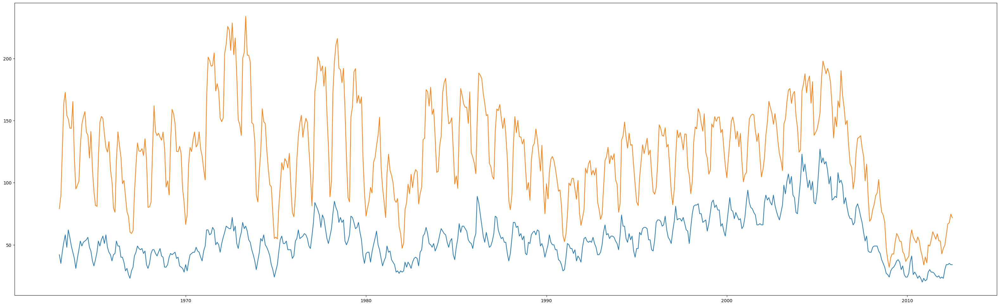

In [6]:
plt.figure(figsize=(40,12))
plt.plot(df_new['Date'],df_new['hsold'],label='hsold')
plt.plot(df_new['Date'],df_new['hstart'],label='hstart')
plt.rcParams["font.size"]="20"

In [7]:
df_ = df_new.copy()
df_

,Date,hsold,hstart
0,1963-01-01,42,79.0
1,1963-02-01,35,89.6
2,1963-03-01,44,124.8
3,1963-04-01,52,164.2
4,1963-05-01,58,172.7
...,...,...,...
590,2012-03-01,34,58.0
591,2012-04-01,34,66.8
592,2012-05-01,35,67.8
593,2012-06-01,34,74.7


In [8]:
#Date Time Features
df_['year']  = df_['Date'].dt.year
df_['month']  = df_['Date'].dt.month

In [9]:
#Lag features
df_[f"hsold_lag_1"] = df_["hsold"].shift(periods=1)
df_[f"hsold_lag_2"] = df_["hsold"].shift(periods=2)
df_[f"hsold_lag_3"] = df_["hsold"].shift(periods=3)
df_[f"hsold_lag_4"] = df_["hsold"].shift(periods=4)
df_[f"hsold_lag_5"] = df_["hsold"].shift(periods=5)
df_[f"hsold_lag_6"] = df_["hsold"].shift(periods=6)
df_[f"hsold_lag_7"] = df_["hsold"].shift(periods=7)
df_[f"hsold_lag_8"] = df_["hsold"].shift(periods=8)
df_[f"hsold_lag_12"] = df_["hsold"].shift(periods=12)
df_[f"hsold_lag_14"] = df_["hsold"].shift(periods=14)
df_[f"hsold_lag_16"] = df_["hsold"].shift(periods=16)
df_[f"hsold_lag_18"] = df_["hsold"].shift(periods=18)
df_[f"hsold_lag_20"] = df_["hsold"].shift(periods=20)
df_[f"hsold_lag_22"] = df_["hsold"].shift(periods=22)
df_[f"hsold_lag_24"] = df_["hsold"].shift(periods=24)
df_[f"hsold_lag_28"] = df_["hsold"].shift(periods=28)
df_[f"hsold_lag_30"] = df_["hsold"].shift(periods=30)


In [10]:
#Lag features
df_[f"hstart_lag_1"] = df_["hstart"].shift(periods=1)
df_[f"hstart_lag_2"] = df_["hstart"].shift(periods=2)
df_[f"hstart_lag_3"] = df_["hstart"].shift(periods=3)
df_[f"hstart_lag_4"] = df_["hstart"].shift(periods=4)
df_[f"hstart_lag_5"] = df_["hstart"].shift(periods=5)
df_[f"hstart_lag_6"] = df_["hstart"].shift(periods=6)
df_[f"hstart_lag_7"] = df_["hstart"].shift(periods=7)
df_[f"hstart_lag_8"] = df_["hstart"].shift(periods=8)
df_[f"hstart_lag_12"] = df_["hstart"].shift(periods=12)
df_[f"hstart_lag_14"] = df_["hstart"].shift(periods=14)
df_[f"hstart_lag_16"] = df_["hstart"].shift(periods=16)
df_[f"hstart_lag_18"] = df_["hstart"].shift(periods=18)
df_[f"hstart_lag_20"] = df_["hstart"].shift(periods=20)
df_[f"hstart_lag_22"] = df_["hstart"].shift(periods=22)
df_[f"hstart_lag_24"] = df_["hstart"].shift(periods=24)
df_[f"hstart_lag_28"] = df_["hstart"].shift(periods=28)
df_[f"hstart_lag_30"] = df_["hstart"].shift(periods=30)


In [11]:
#Rolling window feature
df_['rolling_mean_hsold_7'] = df_['hsold'].rolling(window=7).mean()
df_['rolling_mean_hsold_12'] = df_['hsold'].rolling(window=12).mean()
df_['rolling_mean_hsold_16'] = df_['hsold'].rolling(window=16).mean()
df_['rolling_mean_hsold_20'] = df_['hsold'].rolling(window=20).mean()
df_['rolling_mean_hsold_20'] = df_['hsold'].rolling(window=24).mean()
df_['rolling_mean_hsold_20'] = df_['hsold'].rolling(window=28).mean()
df_['rolling_mean_hsold_20'] = df_['hsold'].rolling(window=32).mean()
df_['rolling_mean_hsold_40'] = df_['hsold'].rolling(window=40).mean()
df_['rolling_mean_hsold_80'] = df_['hsold'].rolling(window=80).mean()
df_['rolling_mean_hsold_100'] = df_['hsold'].rolling(window=100).mean()
df_['rolling_mean_hsold_200'] = df_['hsold'].rolling(window=200).mean()

In [12]:
df_['rolling_mean_hstart_7'] = df_['hstart'].rolling(window=7).mean()
df_['rolling_mean_hstart_12'] = df_['hstart'].rolling(window=12).mean()
df_['rolling_mean_hstart_16'] = df_['hstart'].rolling(window=16).mean()
df_['rolling_mean_hstart_20'] = df_['hstart'].rolling(window=20).mean()
df_['rolling_mean_hstart_24'] = df_['hstart'].rolling(window=24).mean()
df_['rolling_mean_hstart_24'] = df_['hstart'].rolling(window=28).mean()
df_['rolling_mean_hstart_24'] = df_['hstart'].rolling(window=32).mean()
df_['rolling_mean_hstart_40'] = df_['hstart'].rolling(window=40).mean()
df_['rolling_mean_hstart_80'] = df_['hstart'].rolling(window=80).mean()
df_['rolling_mean_hstart_100'] = df_['hstart'].rolling(window=100).mean()
df_['rolling_mean_hstart_200'] = df_['hstart'].rolling(window=200).mean()

In [13]:
#Expanding Window feature
df_['expanding_mean_hstart_7'] = df_['hstart'].expanding(7).mean()
df_['expanding_mean_hstart_12'] = df_['hstart'].expanding(12).mean()
df_['expanding_mean_hstart_16'] = df_['hstart'].expanding(16).mean()
df_['expanding_mean_hstart_20'] = df_['hstart'].expanding(20).mean()
df_['expanding_mean_hstart_24'] = df_['hstart'].expanding(24).mean()
df_['expanding_mean_hstart_28'] = df_['hstart'].expanding(28).mean()
df_['expanding_mean_hstart_40'] = df_['hstart'].expanding(40).mean()
df_['expanding_mean_hstart_80'] = df_['hstart'].expanding(80).mean()
df_['expanding_mean_hstart_100'] = df_['hstart'].expanding(100).mean()
df_['expanding_mean_hstart_200'] = df_['hstart'].expanding(200).mean()

In [14]:
#Expanding Window feature
df_['expanding_mean_hsold_7'] = df_['hsold'].expanding(7).mean()
df_['expanding_mean_hsold_12'] = df_['hsold'].expanding(12).mean()
df_['expanding_mean_hsold_16'] = df_['hsold'].expanding(16).mean()
df_['expanding_mean_hsold_20'] = df_['hsold'].expanding(20).mean()
df_['expanding_mean_hsold_24'] = df_['hsold'].expanding(24).mean()
df_['expanding_mean_hsold_28'] = df_['hsold'].expanding(28).mean()
df_['expanding_mean_hsold_40'] = df_['hsold'].expanding(40).mean()
df_['expanding_mean_hsold_80'] = df_['hsold'].expanding(80).mean()
df_['expanding_mean_hsold_100'] = df_['hsold'].expanding(100).mean()
df_['expanding_mean_hsold_200'] = df_['hsold'].expanding(200).mean()

In [15]:
#Remove seasonality using differencing
df_['hsold_diff_1'] = df_['hsold'] - df_["hsold"].shift(periods=1)
df_['hsold_diff_2'] = df_['hsold'] - df_["hsold"].shift(periods=2)
df_['hsold_diff_3'] = df_['hsold'] - df_["hsold"].shift(periods=3)
df_['hsold_diff_4'] = df_['hsold'] - df_["hsold"].shift(periods=4)
df_['hsold_diff_7'] = df_['hsold'] - df_["hsold"].shift(periods=7)
df_['hsold_diff_12'] = df_['hsold'] - df_["hsold"].shift(periods=12)


df_['hstart_diff_1'] = df_['hstart'] - df_["hstart"].shift(periods=1)
df_['hstart_diff_2'] = df_['hstart'] - df_["hstart"].shift(periods=2)
df_['hstart_diff_3'] = df_['hstart'] - df_["hstart"].shift(periods=3)
df_['hstart_diff_4'] = df_['hstart'] - df_["hstart"].shift(periods=4)
df_['hstart_diff_7'] = df_['hstart'] - df_["hstart"].shift(periods=7)
df_['hstart_diff_12'] = df_['hstart'] - df_["hstart"].shift(periods=12)



In [27]:
df_

,Date,hsold,hstart,year,month,hsold_lag_1,hsold_lag_2,hsold_lag_3,hsold_lag_4,hsold_lag_5,...,hsold_diff_3,hsold_diff_4,hsold_diff_7,hsold_diff_12,hstart_diff_1,hstart_diff_2,hstart_diff_3,hstart_diff_4,hstart_diff_7,hstart_diff_12
0,1963-01-01,42,79.0,1963,1,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1963-02-01,35,89.6,1963,2,42.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,10.6,NaN,NaN,NaN,NaN,NaN
2,1963-03-01,44,124.8,1963,3,35.0,42.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,35.2,45.8,NaN,NaN,NaN,NaN
3,1963-04-01,52,164.2,1963,4,44.0,35.0,42.0,NaN,NaN,...,10.0,NaN,NaN,NaN,39.4,74.6,85.2,NaN,NaN,NaN
4,1963-05-01,58,172.7,1963,5,52.0,44.0,35.0,42.0,NaN,...,23.0,16.0,NaN,NaN,8.5,47.9,83.1,93.7,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590,2012-03-01,34,58.0,2012,3,30.0,23.0,24.0,23.0,25.0,...,10.0,11.0,9.0,6.0,8.3,10.8,15.3,5.0,3.5,8.1
591,2012-04-01,34,66.8,2012,4,34.0,30.0,23.0,24.0,23.0,...,11.0,10.0,10.0,4.0,8.8,17.1,19.6,24.1,8.0,17.8
592,2012-05-01,35,67.8,2012,5,34.0,34.0,30.0,23.0,24.0,...,5.0,12.0,10.0,7.0,1.0,9.8,18.1,20.6,14.6,13.8
593,2012-06-01,34,74.7,2012,6,35.0,34.0,34.0,30.0,23.0,...,0.0,4.0,11.0,6.0,6.9,7.9,16.7,25.0,21.7,14.2


In [41]:
y = df_[['Date',"hsold",'hsold_lag_1','hsold_lag_2','hsold_lag_3','hsold_lag_4']]

In [42]:
y

,Date,hsold,hsold_lag_1,hsold_lag_2,hsold_lag_3,hsold_lag_4
0,1963-01-01,42,NaN,NaN,NaN,NaN
1,1963-02-01,35,42.0,NaN,NaN,NaN
2,1963-03-01,44,35.0,42.0,NaN,NaN
3,1963-04-01,52,44.0,35.0,42.0,NaN
4,1963-05-01,58,52.0,44.0,35.0,42.0
...,...,...,...,...,...,...
590,2012-03-01,34,30.0,23.0,24.0,23.0
591,2012-04-01,34,34.0,30.0,23.0,24.0
592,2012-05-01,35,34.0,34.0,30.0,23.0
593,2012-06-01,34,35.0,34.0,34.0,30.0


In [ ]:
y = df_[["hsold",'hsold_lag_1','hsold_lag_2','hsold_lag_3','hsold_lag_4']]

In [43]:
df_[['Date',"hsold",'rolling_mean_hsold_7','rolling_mean_hsold_12','rolling_mean_hsold_16','rolling_mean_hsold_20']]

,Date,hsold,rolling_mean_hsold_7,rolling_mean_hsold_12,rolling_mean_hsold_16,rolling_mean_hsold_20
0,1963-01-01,42,NaN,NaN,NaN,NaN
1,1963-02-01,35,NaN,NaN,NaN,NaN
2,1963-03-01,44,NaN,NaN,NaN,NaN
3,1963-04-01,52,NaN,NaN,NaN,NaN
4,1963-05-01,58,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
590,2012-03-01,34,26.142857,26.750000,25.9375,26.96875
591,2012-04-01,34,27.571429,27.083333,26.6250,26.90625
592,2012-05-01,35,29.000000,27.666667,27.5000,27.06250
593,2012-06-01,34,30.571429,28.166667,28.2500,27.09375


In [44]:
df_[['Date',"hsold",'expanding_mean_hstart_7','expanding_mean_hsold_12','expanding_mean_hsold_16','expanding_mean_hsold_20']]

,Date,hsold,expanding_mean_hstart_7,expanding_mean_hsold_12,expanding_mean_hsold_16,expanding_mean_hsold_20
0,1963-01-01,42,NaN,NaN,NaN,NaN
1,1963-02-01,35,NaN,NaN,NaN,NaN
2,1963-03-01,44,NaN,NaN,NaN,NaN
3,1963-04-01,52,NaN,NaN,NaN,NaN
4,1963-05-01,58,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
590,2012-03-01,34,123.623858,55.746193,55.746193,55.746193
591,2012-04-01,34,123.527872,55.709459,55.709459,55.709459
592,2012-05-01,35,123.433895,55.674536,55.674536,55.674536
593,2012-06-01,34,123.351852,55.638047,55.638047,55.638047


In [46]:
df_[["hsold",'hsold_lag_1','hsold_diff_1','rolling_mean_hsold_7','expanding_mean_hstart_7',]]

,hsold,hsold_lag_1,hsold_diff_1,rolling_mean_hsold_7,expanding_mean_hstart_7
0,42,NaN,NaN,NaN,NaN
1,35,42.0,-7.0,NaN,NaN
2,44,35.0,9.0,NaN,NaN
3,52,44.0,8.0,NaN,NaN
4,58,52.0,6.0,NaN,NaN
...,...,...,...,...,...
590,34,30.0,4.0,26.142857,123.623858
591,34,34.0,0.0,27.571429,123.527872
592,35,34.0,1.0,29.000000,123.433895
593,34,35.0,-1.0,30.571429,123.351852


In [24]:
df = df_.fillna(0)

# Random Forest

In [25]:
#Splitting data into x,y
y =df["hsold"]
X =df.drop(["Date","hsold","hstart"],axis=1)

In [26]:
X

,year,month,hsold_lag_1,hsold_lag_2,hsold_lag_3,hsold_lag_4,hsold_lag_5,hsold_lag_6,hsold_lag_7,hsold_lag_8,...,hsold_diff_3,hsold_diff_4,hsold_diff_7,hsold_diff_12,hstart_diff_1,hstart_diff_2,hstart_diff_3,hstart_diff_4,hstart_diff_7,hstart_diff_12
0,1963,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1963,2,42.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,10.6,0.0,0.0,0.0,0.0,0.0
2,1963,3,35.0,42.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,35.2,45.8,0.0,0.0,0.0,0.0
3,1963,4,44.0,35.0,42.0,0.0,0.0,0.0,0.0,0.0,...,10.0,0.0,0.0,0.0,39.4,74.6,85.2,0.0,0.0,0.0
4,1963,5,52.0,44.0,35.0,42.0,0.0,0.0,0.0,0.0,...,23.0,16.0,0.0,0.0,8.5,47.9,83.1,93.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590,2012,3,30.0,23.0,24.0,23.0,25.0,24.0,25.0,27.0,...,10.0,11.0,9.0,6.0,8.3,10.8,15.3,5.0,3.5,8.1
591,2012,4,34.0,30.0,23.0,24.0,23.0,25.0,24.0,25.0,...,11.0,10.0,10.0,4.0,8.8,17.1,19.6,24.1,8.0,17.8
592,2012,5,34.0,34.0,30.0,23.0,24.0,23.0,25.0,24.0,...,5.0,12.0,10.0,7.0,1.0,9.8,18.1,20.6,14.6,13.8
593,2012,6,35.0,34.0,34.0,30.0,23.0,24.0,23.0,25.0,...,0.0,4.0,11.0,6.0,6.9,7.9,16.7,25.0,21.7,14.2


In [82]:
train_size = int(len(X)*0.8)
test_size_x = len(X) - train_size
train_data_x = X[:train_size]
test_data_x =  X[train_size:]

In [83]:
train_size = int(len(y)*0.8)
test_size_y = len(y) - train_size
train_data_y = y[:train_size]
test_data_y =  y[train_size:]

In [84]:
train_data_x

,year,month,hsold_lag_1,hsold_lag_2,hsold_lag_3,hsold_lag_4,hsold_lag_5,hsold_lag_6,hsold_lag_7,hsold_lag_8,...,hsold_diff_3,hsold_diff_4,hsold_diff_7,hsold_diff_12,hstart_diff_1,hstart_diff_2,hstart_diff_3,hstart_diff_4,hstart_diff_7,hstart_diff_12
0,1963,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1963,2,42.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,10.6,0.0,0.0,0.0,0.0,0.0
2,1963,3,35.0,42.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,35.2,45.8,0.0,0.0,0.0,0.0
3,1963,4,44.0,35.0,42.0,0.0,0.0,0.0,0.0,0.0,...,10.0,0.0,0.0,0.0,39.4,74.6,85.2,0.0,0.0,0.0
4,1963,5,52.0,44.0,35.0,42.0,0.0,0.0,0.0,0.0,...,23.0,16.0,0.0,0.0,8.5,47.9,83.1,93.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
471,2002,4,90.0,84.0,66.0,66.0,67.0,66.0,66.0,74.0,...,20.0,20.0,20.0,2.0,10.6,28.4,38.4,44.2,15.7,-2.5
472,2002,5,86.0,90.0,84.0,66.0,66.0,67.0,66.0,66.0,...,4.0,22.0,22.0,8.0,16.7,27.3,45.1,55.1,25.7,11.5
473,2002,6,88.0,86.0,90.0,84.0,66.0,66.0,67.0,66.0,...,-6.0,0.0,17.0,5.0,-5.2,11.5,22.1,39.9,39.3,5.1
474,2002,7,84.0,88.0,86.0,90.0,84.0,66.0,66.0,67.0,...,-4.0,-8.0,16.0,6.0,-4.4,-9.6,7.1,17.7,51.3,1.3


In [85]:
model_rf = RandomForestClassifier()

In [86]:
#fit the model
model_rf.fit(train_data_x,train_data_y)

#calculate the accueacy of the classifier
y_pred = model_rf.predict(test_data_x)
accuracy =accuracy_score(test_data_y,y_pred)
print(accuracy)

0.03361344537815126


In [87]:
model_rf.feature_importances_

array([0.00662973, 0.00875532, 0.02423104, 0.01636205, 0.01314266,
       0.01311358, 0.01091224, 0.01173743, 0.01271523, 0.01325186,
       0.01824627, 0.01140204, 0.0111998 , 0.0131959 , 0.01207797,
       0.01233407, 0.01302176, 0.00985924, 0.01189651, 0.01416761,
       0.01339397, 0.01349185, 0.00966311, 0.01327098, 0.01449123,
       0.01446786, 0.01263746, 0.01254646, 0.01251355, 0.01175487,
       0.01188137, 0.0125224 , 0.0145594 , 0.01057576, 0.01417725,
       0.01247674, 0.01812066, 0.01570199, 0.01453186, 0.00862832,
       0.01015392, 0.00896959, 0.00885677, 0.00642796, 0.0124555 ,
       0.01061655, 0.01183177, 0.00873453, 0.01051686, 0.00981728,
       0.00857728, 0.00902077, 0.00767076, 0.00802847, 0.00899796,
       0.00941708, 0.00787556, 0.00883284, 0.00720089, 0.00723191,
       0.00651078, 0.00627285, 0.0064964 , 0.00974334, 0.00952109,
       0.00853704, 0.00791887, 0.009395  , 0.00871365, 0.0092816 ,
       0.00746376, 0.0071156 , 0.0063054 , 0.0154475 , 0.01716

In [88]:
model_rf.feature_names_in_


array(['year', 'month', 'hsold_lag_1', 'hsold_lag_2', 'hsold_lag_3',
       'hsold_lag_4', 'hsold_lag_5', 'hsold_lag_6', 'hsold_lag_7',
       'hsold_lag_8', 'hsold_lag_12', 'hsold_lag_14', 'hsold_lag_16',
       'hsold_lag_18', 'hsold_lag_20', 'hsold_lag_22', 'hsold_lag_24',
       'hsold_lag_28', 'hsold_lag_30', 'hstart_lag_1', 'hstart_lag_2',
       'hstart_lag_3', 'hstart_lag_4', 'hstart_lag_5', 'hstart_lag_6',
       'hstart_lag_7', 'hstart_lag_8', 'hstart_lag_12', 'hstart_lag_14',
       'hstart_lag_16', 'hstart_lag_18', 'hstart_lag_20', 'hstart_lag_22',
       'hstart_lag_24', 'hstart_lag_28', 'hstart_lag_30',
       'rolling_mean_hsold_7', 'rolling_mean_hsold_12',
       'rolling_mean_hsold_16', 'rolling_mean_hsold_20',
       'rolling_mean_hsold_40', 'rolling_mean_hsold_80',
       'rolling_mean_hsold_100', 'rolling_mean_hsold_200',
       'rolling_mean_hstart_7', 'rolling_mean_hstart_12',
       'rolling_mean_hstart_16', 'rolling_mean_hstart_20',
       'rolling_mean_hstart_2

<BarContainer object of 85 artists>

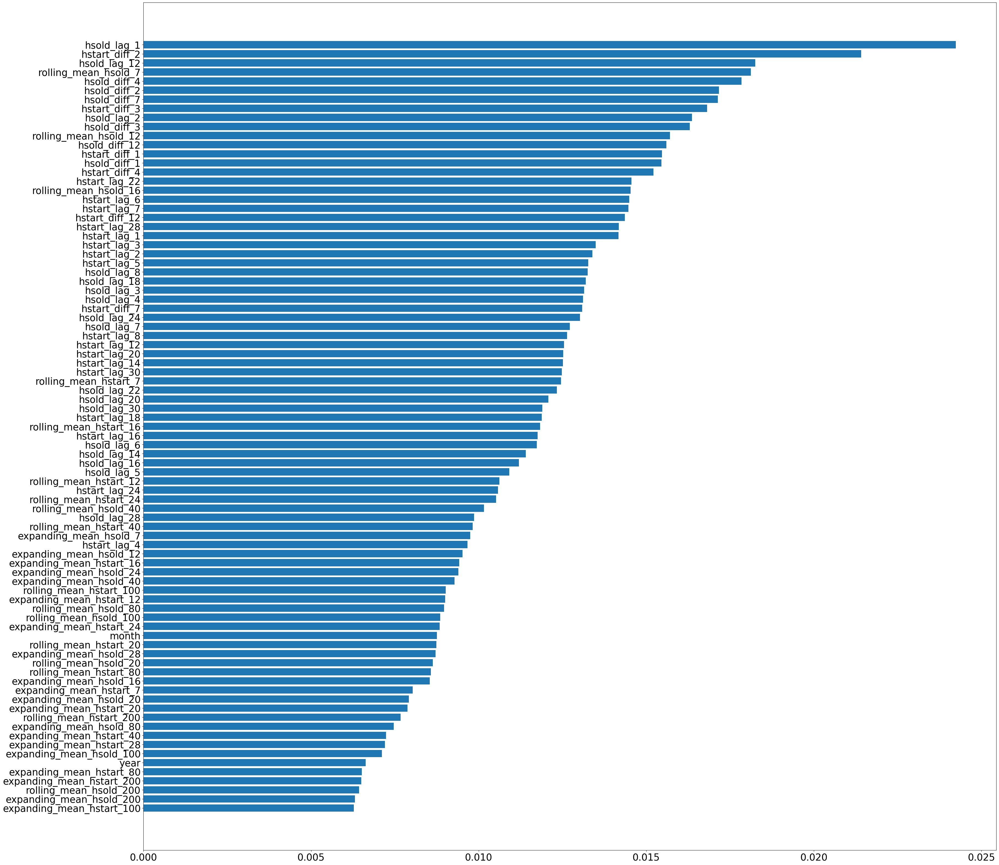

In [89]:
importances_df = pd.DataFrame({"feature_names" : model_rf.feature_names_in_, 
                               "importances" : model_rf.feature_importances_})

importances_df.sort_values(by=["importances"], ascending =True, inplace=True)                             
# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="25"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])
#g.set_title("Feature importances", fontsize=25);                          


# RandomForest hstart data

In [90]:
#Splitting data into x,y
y_hstart = df["hstart"].astype(int)

X_hstart =df.drop(["Date","hsold","hstart"],axis=1)

In [91]:
train_size = int(len(X_hstart)*0.8)
test_size_x = len(X_hstart) - train_size
train_data_x_hstart = X_hstart[:train_size]
test_data_x_hstart =  X_hstart[train_size:]

In [92]:
train_size = int(len(y_hstart)*0.8)
test_size_y = len(y_hstart) - train_size
train_data_y_hstart = y_hstart[:train_size]
test_data_y_hstart =  y_hstart[train_size:]
train_data_y_hstart

0       79
1       89
2      124
3      164
4      172
      ... 
471    148
472    165
473    160
474    155
475    147
Name: hstart, Length: 476, dtype: int32

In [93]:
model_rf_hstart = RandomForestClassifier()


In [94]:
model_rf_hstart.fit(train_data_x_hstart,train_data_y_hstart)

#calculate the accueacy of the classifier
y_pred = model_rf.predict(test_data_x_hstart)
accuracy =accuracy_score(test_data_y_hstart,y_pred)
print(accuracy)


0.01680672268907563


<BarContainer object of 85 artists>

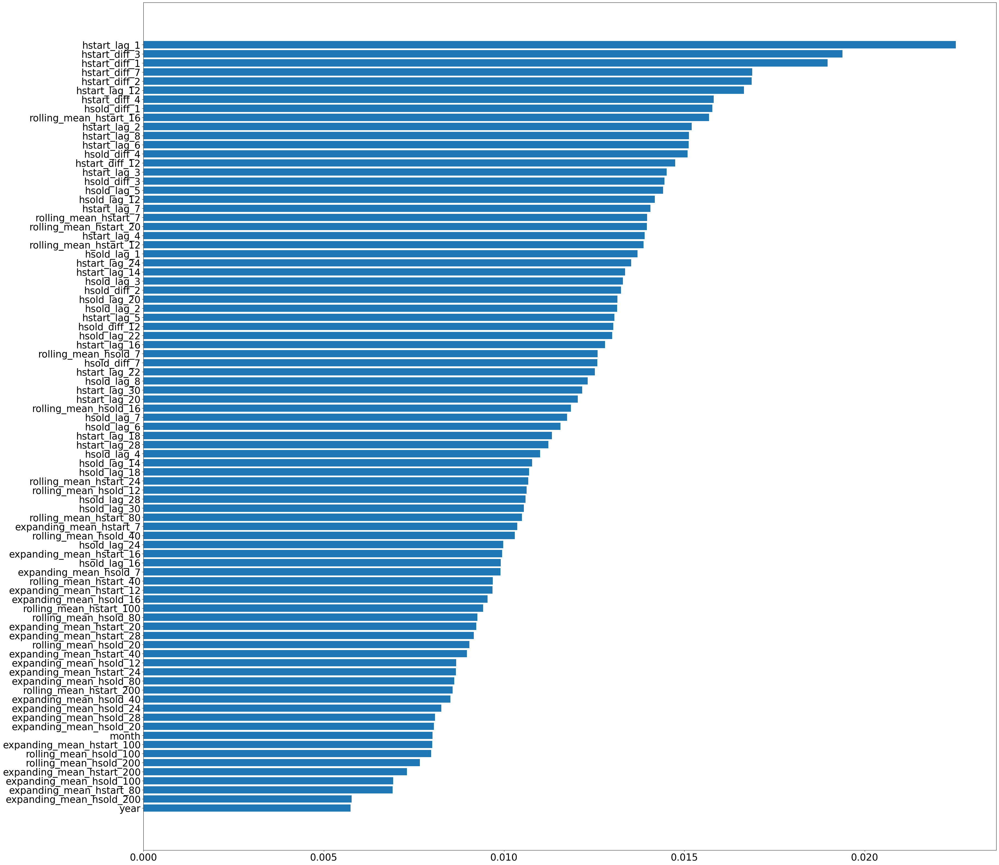

In [95]:
importances_df = pd.DataFrame({"feature_names" : model_rf_hstart.feature_names_in_, 
                               "importances" : model_rf_hstart.feature_importances_})
importances_df.sort_values(by=["importances"], ascending =True, inplace=True)                  
# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="25"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])

In [43]:
#Correlation
cor = df.corr()
top_corr_features = cor.index
plt.figure(figsize=(100,100))
g = sb.heatmap(df_[top_corr_features].corr(),annot=True,)

C:\Users\User\AppData\Local\Temp\ipykernel_20320\1298823419.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  cor = df.corr()


# XGB classifier

In [96]:
#Splitting data into x,y
y =df["hsold"]
X =df.drop(["Date","hsold","hstart"],axis=1)

In [97]:
train_size = int(len(X)*0.8)
test_size_x = len(X) - train_size
train_data_x = X[:train_size]
test_data_x =  X[train_size:]
train_data_x

,year,month,hsold_lag_1,hsold_lag_2,hsold_lag_3,hsold_lag_4,hsold_lag_5,hsold_lag_6,hsold_lag_7,hsold_lag_8,...,hsold_diff_3,hsold_diff_4,hsold_diff_7,hsold_diff_12,hstart_diff_1,hstart_diff_2,hstart_diff_3,hstart_diff_4,hstart_diff_7,hstart_diff_12
0,1963,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1963,2,42.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,10.6,0.0,0.0,0.0,0.0,0.0
2,1963,3,35.0,42.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,35.2,45.8,0.0,0.0,0.0,0.0
3,1963,4,44.0,35.0,42.0,0.0,0.0,0.0,0.0,0.0,...,10.0,0.0,0.0,0.0,39.4,74.6,85.2,0.0,0.0,0.0
4,1963,5,52.0,44.0,35.0,42.0,0.0,0.0,0.0,0.0,...,23.0,16.0,0.0,0.0,8.5,47.9,83.1,93.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
471,2002,4,90.0,84.0,66.0,66.0,67.0,66.0,66.0,74.0,...,20.0,20.0,20.0,2.0,10.6,28.4,38.4,44.2,15.7,-2.5
472,2002,5,86.0,90.0,84.0,66.0,66.0,67.0,66.0,66.0,...,4.0,22.0,22.0,8.0,16.7,27.3,45.1,55.1,25.7,11.5
473,2002,6,88.0,86.0,90.0,84.0,66.0,66.0,67.0,66.0,...,-6.0,0.0,17.0,5.0,-5.2,11.5,22.1,39.9,39.3,5.1
474,2002,7,84.0,88.0,86.0,90.0,84.0,66.0,66.0,67.0,...,-4.0,-8.0,16.0,6.0,-4.4,-9.6,7.1,17.7,51.3,1.3


In [98]:
train_size = int(len(y)*0.8)
test_size_y = len(y) - train_size
train_data_y = y[:train_size]
test_data_y =  y[train_size:]
train_data_y

0      42
1      35
2      44
3      52
4      58
       ..
471    86
472    88
473    84
474    82
475    90
Name: hsold, Length: 476, dtype: int64

In [99]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
train_data_y = le.fit_transform(train_data_y)
test_data_y = le.fit_transform(test_data_y)
train_data_y.shape

(476,)

In [100]:
xgb_model = xgb.XGBClassifier()
xgb_model.fit(train_data_x,train_data_y)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', ...)

In [101]:
#calculate the accueacy of the classifier
y_pred = xgb_model.predict(test_data_x)
accuracy =accuracy_score(test_data_y,y_pred)
print(accuracy)

0.05042016806722689


<BarContainer object of 85 artists>

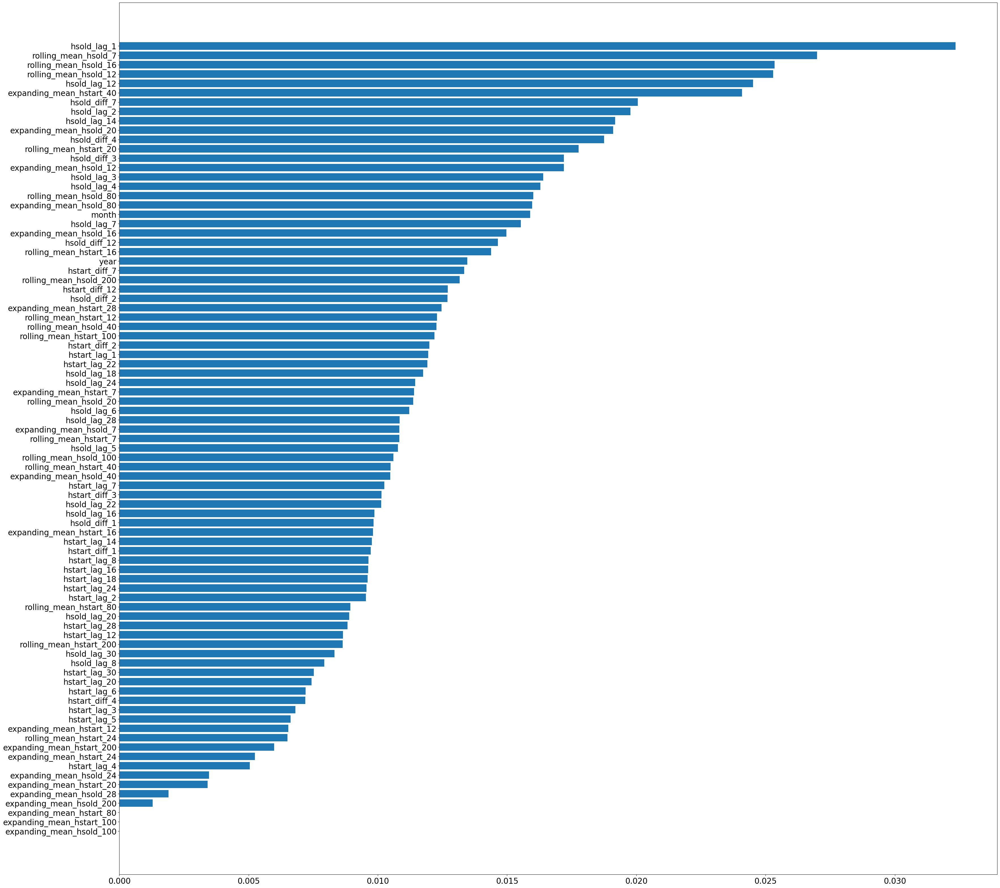

In [102]:
importances_df = pd.DataFrame({"feature_names" : xgb_model.feature_names_in_, 
                               "importances" : xgb_model.feature_importances_})
importances_df.sort_values(by=["importances"], ascending =True, inplace=True)   
                             
# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="20"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])

# XGB For hstart

In [103]:
#Splitting data into x,y
y =df["hstart"]
X =df.drop(["Date","hsold","hstart"],axis=1)

In [104]:
train_size = int(len(X)*0.8)
test_size = len(X) - train_size
train_data_x_hstart = X[:train_size]
test_data_x_hstart =  X[train_size:]
train_data_x_hstart

,year,month,hsold_lag_1,hsold_lag_2,hsold_lag_3,hsold_lag_4,hsold_lag_5,hsold_lag_6,hsold_lag_7,hsold_lag_8,...,hsold_diff_3,hsold_diff_4,hsold_diff_7,hsold_diff_12,hstart_diff_1,hstart_diff_2,hstart_diff_3,hstart_diff_4,hstart_diff_7,hstart_diff_12
0,1963,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1963,2,42.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,10.6,0.0,0.0,0.0,0.0,0.0
2,1963,3,35.0,42.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,35.2,45.8,0.0,0.0,0.0,0.0
3,1963,4,44.0,35.0,42.0,0.0,0.0,0.0,0.0,0.0,...,10.0,0.0,0.0,0.0,39.4,74.6,85.2,0.0,0.0,0.0
4,1963,5,52.0,44.0,35.0,42.0,0.0,0.0,0.0,0.0,...,23.0,16.0,0.0,0.0,8.5,47.9,83.1,93.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
471,2002,4,90.0,84.0,66.0,66.0,67.0,66.0,66.0,74.0,...,20.0,20.0,20.0,2.0,10.6,28.4,38.4,44.2,15.7,-2.5
472,2002,5,86.0,90.0,84.0,66.0,66.0,67.0,66.0,66.0,...,4.0,22.0,22.0,8.0,16.7,27.3,45.1,55.1,25.7,11.5
473,2002,6,88.0,86.0,90.0,84.0,66.0,66.0,67.0,66.0,...,-6.0,0.0,17.0,5.0,-5.2,11.5,22.1,39.9,39.3,5.1
474,2002,7,84.0,88.0,86.0,90.0,84.0,66.0,66.0,67.0,...,-4.0,-8.0,16.0,6.0,-4.4,-9.6,7.1,17.7,51.3,1.3


In [105]:
train_size = int(len(y)*0.8)
test_size = len(y) - train_size
train_data_y_hstart = y[:train_size]
test_data_y_hstart =  y[train_size:]
train_data_y_hstart

0       79.0
1       89.6
2      124.8
3      164.2
4      172.7
       ...  
471    148.8
472    165.5
473    160.3
474    155.9
475    147.0
Name: hstart, Length: 476, dtype: float64

In [106]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
train_data_y_hstart = le.fit_transform(train_data_y_hstart)
train_data_y_hstart.shape
test_data_y_hstart = le.fit_transform(test_data_y_hstart)

In [107]:
xgb_model = xgb.XGBClassifier()
xgb_model.fit(train_data_x_hstart,train_data_y_hstart)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_bin=256, max_cat_threshold=64, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', ...)

In [108]:
#calculate the accueacy of the classifier
y_pred = xgb_model.predict(test_data_x_hstart)
accuracy =accuracy_score(test_data_y_hstart,y_pred)
print(accuracy)

0.0


<BarContainer object of 85 artists>

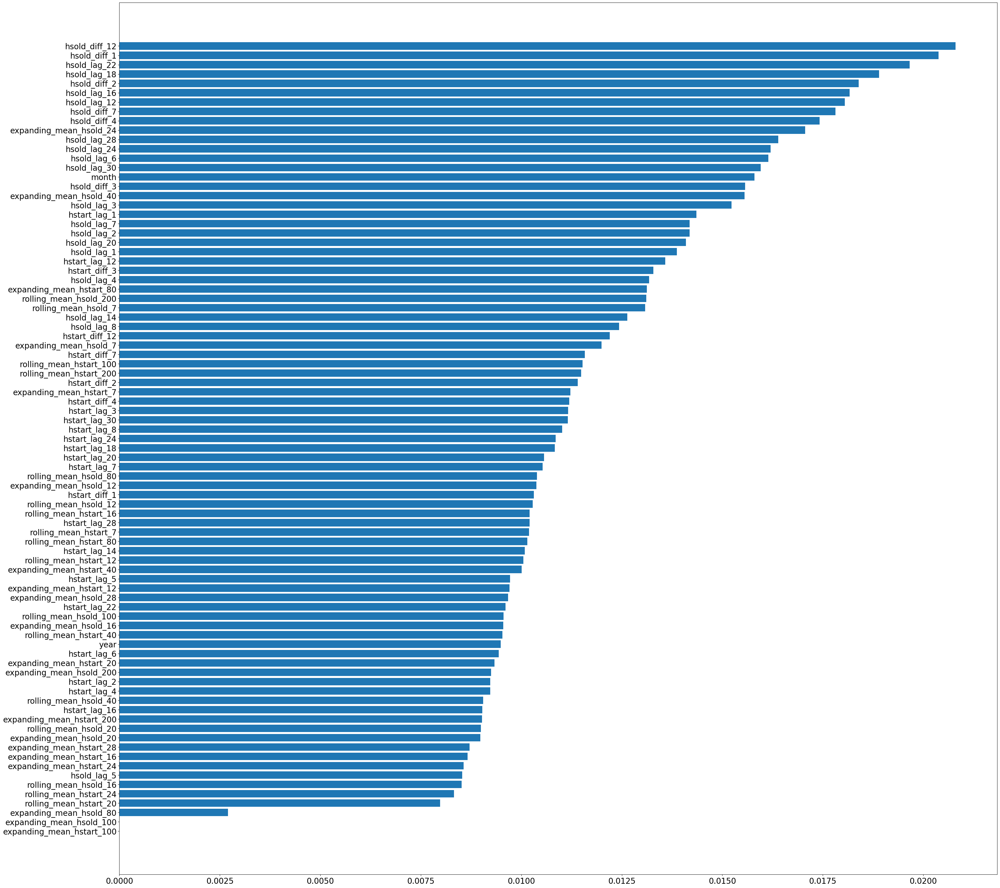

In [109]:
importances_df = pd.DataFrame({"feature_names" : xgb_model.feature_names_in_, 
                               "importances" : xgb_model.feature_importances_})
importances_df.sort_values(by=["importances"], ascending =True, inplace=True)   

# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="20"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])

# Decision Tree classifier

In [110]:
#Splitting data into x,y
y =df["hsold"]
X =df.drop(["Date","hsold","hstart"],axis=1)

In [111]:
train_size = int(len(X)*0.8)
test_size_x = len(X) - train_size
train_data_x = X[:train_size]
test_data_x =  X[train_size:]
train_data_x

,year,month,hsold_lag_1,hsold_lag_2,hsold_lag_3,hsold_lag_4,hsold_lag_5,hsold_lag_6,hsold_lag_7,hsold_lag_8,...,hsold_diff_3,hsold_diff_4,hsold_diff_7,hsold_diff_12,hstart_diff_1,hstart_diff_2,hstart_diff_3,hstart_diff_4,hstart_diff_7,hstart_diff_12
0,1963,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1963,2,42.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,10.6,0.0,0.0,0.0,0.0,0.0
2,1963,3,35.0,42.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,35.2,45.8,0.0,0.0,0.0,0.0
3,1963,4,44.0,35.0,42.0,0.0,0.0,0.0,0.0,0.0,...,10.0,0.0,0.0,0.0,39.4,74.6,85.2,0.0,0.0,0.0
4,1963,5,52.0,44.0,35.0,42.0,0.0,0.0,0.0,0.0,...,23.0,16.0,0.0,0.0,8.5,47.9,83.1,93.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
471,2002,4,90.0,84.0,66.0,66.0,67.0,66.0,66.0,74.0,...,20.0,20.0,20.0,2.0,10.6,28.4,38.4,44.2,15.7,-2.5
472,2002,5,86.0,90.0,84.0,66.0,66.0,67.0,66.0,66.0,...,4.0,22.0,22.0,8.0,16.7,27.3,45.1,55.1,25.7,11.5
473,2002,6,88.0,86.0,90.0,84.0,66.0,66.0,67.0,66.0,...,-6.0,0.0,17.0,5.0,-5.2,11.5,22.1,39.9,39.3,5.1
474,2002,7,84.0,88.0,86.0,90.0,84.0,66.0,66.0,67.0,...,-4.0,-8.0,16.0,6.0,-4.4,-9.6,7.1,17.7,51.3,1.3


In [112]:
train_size = int(len(y)*0.8)
test_size_y = len(y) - train_size
train_data_y = y[:train_size]
test_data_y =  y[train_size:]
train_data_y

0      42
1      35
2      44
3      52
4      58
       ..
471    86
472    88
473    84
474    82
475    90
Name: hsold, Length: 476, dtype: int64

In [113]:
des_clf = DecisionTreeClassifier()
des_clf.fit(train_data_x,train_data_y)

DecisionTreeClassifier()

In [114]:
#calculate the accueacy of the classifier
y_pred = des_clf.predict(test_data_x)
accuracy =accuracy_score(test_data_y,y_pred)
print(accuracy)

0.01680672268907563


<BarContainer object of 85 artists>

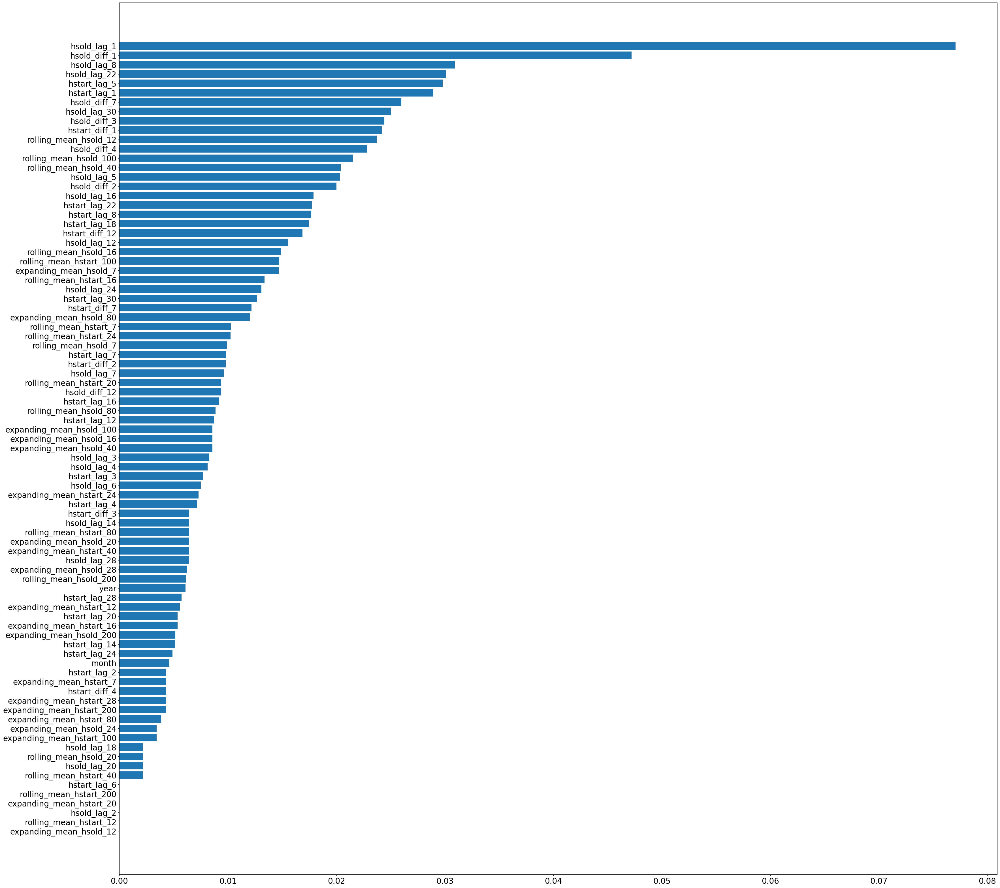

In [115]:
importances_df = pd.DataFrame({"feature_names" : des_clf.feature_names_in_, 
                               "importances" : des_clf.feature_importances_})
importances_df.sort_values(by=["importances"], ascending =True, inplace=True)              
# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="20"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])

# Decision Tree hstart

In [116]:
#Splitting data into x,y
y =df["hstart"].astype(int)
X =df.drop(["Date","hsold","hstart"],axis=1)

In [117]:
train_size = int(len(X)*0.8)
test_size_x = len(X) - train_size
train_data_x_hstart = X[:train_size]
test_data_x_hstart =  X[train_size:]
train_data_x_hstart

,year,month,hsold_lag_1,hsold_lag_2,hsold_lag_3,hsold_lag_4,hsold_lag_5,hsold_lag_6,hsold_lag_7,hsold_lag_8,...,hsold_diff_3,hsold_diff_4,hsold_diff_7,hsold_diff_12,hstart_diff_1,hstart_diff_2,hstart_diff_3,hstart_diff_4,hstart_diff_7,hstart_diff_12
0,1963,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1963,2,42.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,10.6,0.0,0.0,0.0,0.0,0.0
2,1963,3,35.0,42.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,35.2,45.8,0.0,0.0,0.0,0.0
3,1963,4,44.0,35.0,42.0,0.0,0.0,0.0,0.0,0.0,...,10.0,0.0,0.0,0.0,39.4,74.6,85.2,0.0,0.0,0.0
4,1963,5,52.0,44.0,35.0,42.0,0.0,0.0,0.0,0.0,...,23.0,16.0,0.0,0.0,8.5,47.9,83.1,93.7,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
471,2002,4,90.0,84.0,66.0,66.0,67.0,66.0,66.0,74.0,...,20.0,20.0,20.0,2.0,10.6,28.4,38.4,44.2,15.7,-2.5
472,2002,5,86.0,90.0,84.0,66.0,66.0,67.0,66.0,66.0,...,4.0,22.0,22.0,8.0,16.7,27.3,45.1,55.1,25.7,11.5
473,2002,6,88.0,86.0,90.0,84.0,66.0,66.0,67.0,66.0,...,-6.0,0.0,17.0,5.0,-5.2,11.5,22.1,39.9,39.3,5.1
474,2002,7,84.0,88.0,86.0,90.0,84.0,66.0,66.0,67.0,...,-4.0,-8.0,16.0,6.0,-4.4,-9.6,7.1,17.7,51.3,1.3


In [118]:
train_size = int(len(y)*0.8)
test_size_y = len(y) - train_size
train_data_y_hstart = y[:train_size]
test_data_y_hstart =  y[train_size:]
train_data_y_hstart

0       79
1       89
2      124
3      164
4      172
      ... 
471    148
472    165
473    160
474    155
475    147
Name: hstart, Length: 476, dtype: int32

In [119]:
des_clf = DecisionTreeClassifier()
des_clf.fit(train_data_x_hstart,train_data_y_hstart)

DecisionTreeClassifier()

In [120]:
#calculate the accueacy of the classifier
y_pred = des_clf.predict(test_data_x_hstart)
accuracy =accuracy_score(test_data_y_hstart,y_pred)
print(accuracy)

0.025210084033613446


<BarContainer object of 85 artists>

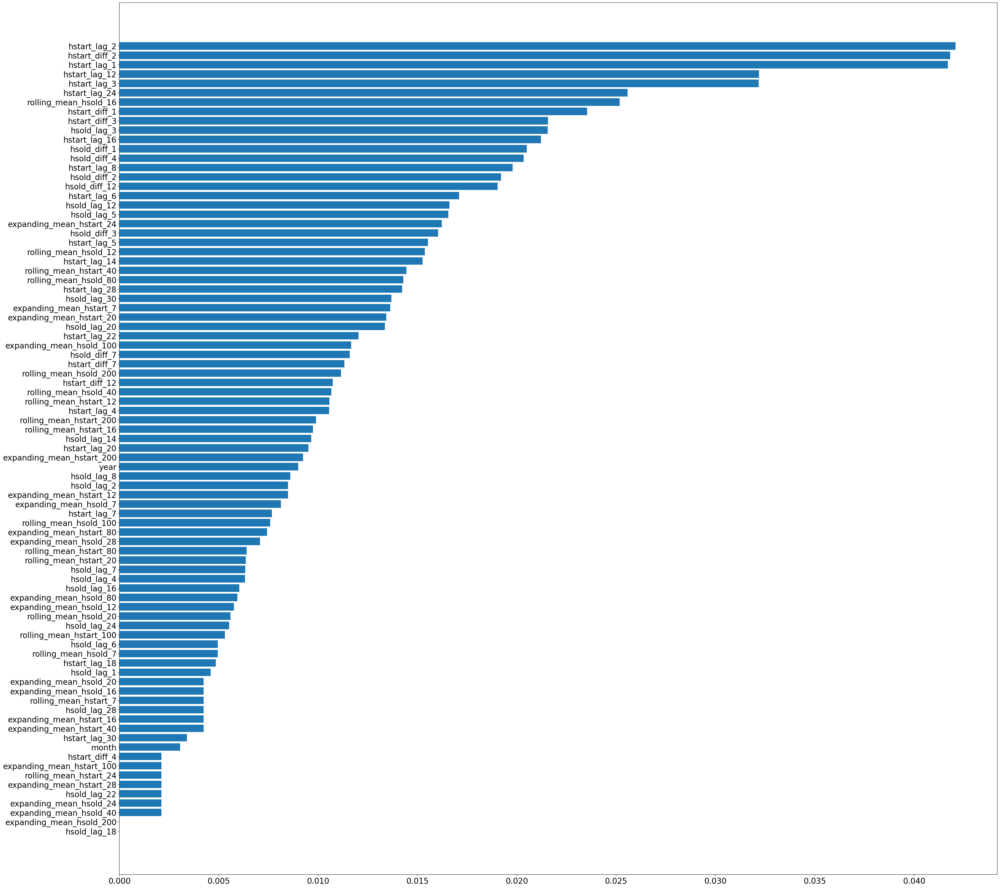

In [121]:
importances_df = pd.DataFrame({"feature_names" : des_clf.feature_names_in_, 
                               "importances" : des_clf.feature_importances_})
importances_df.sort_values(by=["importances"], ascending =True, inplace=True)                             
# Plotting bar chart, g is from graph
plt.figure(figsize=(40,40))
plt.rcParams["font.size"]="20"
plt.barh(importances_df["feature_names"], 
         importances_df["importances"])

# LSTM Implementaion

# LSTM 3 features

In [79]:
#Data set for Random Forest
data_set_1 = df[['hsold','hsold_lag_1','hstart_diff_2','hsold_diff_1']]
data_set_1

,hsold,hsold_lag_1,hstart_diff_2,hsold_diff_1
0,42,0.0,0.0,0.0
1,35,42.0,0.0,-7.0
2,44,35.0,45.8,9.0
3,52,44.0,74.6,8.0
4,58,52.0,47.9,6.0
...,...,...,...,...
590,34,30.0,10.8,4.0
591,34,34.0,17.1,0.0
592,35,34.0,9.8,1.0
593,34,35.0,7.9,-1.0


In [47]:
#Data set for Random Forest
data_set_2 = df[['hsold','hsold_lag_1','hstart_diff_2','hsold_diff_1','hsold_lag_12','rolling_mean_hsold_7','hstart_lag_5'
                ]]
data_set_2

,hsold,hsold_lag_1,hstart_diff_2,hsold_diff_1,hsold_lag_12,rolling_mean_hsold_7,hstart_lag_5
0,42,0.0,0.0,0.0,0.0,0.000000,0.0
1,35,42.0,0.0,-7.0,0.0,0.000000,0.0
2,44,35.0,45.8,9.0,0.0,0.000000,0.0
3,52,44.0,74.6,8.0,0.0,0.000000,0.0
4,58,52.0,47.9,6.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...
590,34,30.0,10.8,4.0,28.0,26.142857,53.2
591,34,34.0,17.1,0.0,30.0,27.571429,53.0
592,35,34.0,9.8,1.0,28.0,29.000000,42.7
593,34,35.0,7.9,-1.0,28.0,30.571429,47.2


In [63]:
#Data set for Random Forest
data_set_3 = df[['hsold','hsold_lag_1','hstart_diff_2','hsold_diff_1','hsold_lag_12','rolling_mean_hsold_7','hstart_lag_5',
                 'hstart_diff_1','rolling_mean_hsold_16','hstart_lag_5'
                ]]
data_set_3

,hsold,hsold_lag_1,hstart_diff_2,hsold_diff_1,hsold_lag_12,rolling_mean_hsold_7,hstart_lag_5,hstart_diff_1,rolling_mean_hsold_16,hstart_lag_5
0,42,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0000,0.0
1,35,42.0,0.0,-7.0,0.0,0.000000,0.0,10.6,0.0000,0.0
2,44,35.0,45.8,9.0,0.0,0.000000,0.0,35.2,0.0000,0.0
3,52,44.0,74.6,8.0,0.0,0.000000,0.0,39.4,0.0000,0.0
4,58,52.0,47.9,6.0,0.0,0.000000,0.0,8.5,0.0000,0.0
...,...,...,...,...,...,...,...,...,...,...
590,34,30.0,10.8,4.0,28.0,26.142857,53.2,8.3,25.9375,53.2
591,34,34.0,17.1,0.0,30.0,27.571429,53.0,8.8,26.6250,53.0
592,35,34.0,9.8,1.0,28.0,29.000000,42.7,1.0,27.5000,42.7
593,34,35.0,7.9,-1.0,28.0,30.571429,47.2,6.9,28.2500,47.2


In [80]:
scaler = MinMaxScaler(feature_range=(0,1))
scaled_dataset = scaler.fit_transform(data_set_1)
scaled_dataset

array([[0.20560748, 0.        , 0.43902439, 0.3877551 ],
       [0.14018692, 0.33070866, 0.43902439, 0.24489796],
       [0.22429907, 0.27559055, 0.69880885, 0.57142857],
       ...,
       [0.14018692, 0.26771654, 0.49461146, 0.40816327],
       [0.13084112, 0.27559055, 0.48383437, 0.36734694],
       [0.13084112, 0.26771654, 0.46114577, 0.3877551 ]])

In [48]:
scaler = MinMaxScaler(feature_range=(0,1))
scaled_dataset = scaler.fit_transform(data_set_2)
scaled_dataset

array([[0.20560748, 0.        , 0.43902439, ..., 0.        , 0.        ,
        0.        ],
       [0.14018692, 0.33070866, 0.43902439, ..., 0.        , 0.        ,
        0.        ],
       [0.22429907, 0.27559055, 0.69880885, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.14018692, 0.26771654, 0.49461146, ..., 0.22047244, 0.24938575,
        0.18247863],
       [0.13084112, 0.27559055, 0.48383437, ..., 0.22047244, 0.26289926,
        0.2017094 ],
       [0.13084112, 0.26771654, 0.46114577, ..., 0.21259843, 0.27518428,
        0.21239316]])

In [64]:
scaler = MinMaxScaler(feature_range=(0,1))
scaled_dataset = scaler.fit_transform(data_set_3)
scaled_dataset

array([[0.20560748, 0.        , 0.43902439, ..., 0.41535921, 0.        ,
        0.        ],
       [0.14018692, 0.33070866, 0.43902439, ..., 0.50289017, 0.        ,
        0.        ],
       [0.22429907, 0.27559055, 0.69880885, ..., 0.70602808, 0.        ,
        0.        ],
       ...,
       [0.14018692, 0.26771654, 0.49461146, ..., 0.42361685, 0.26020106,
        0.18247863],
       [0.13084112, 0.27559055, 0.48383437, ..., 0.47233691, 0.26729746,
        0.2017094 ],
       [0.13084112, 0.26771654, 0.46114577, ..., 0.39058629, 0.27084565,
        0.21239316]])

In [81]:
def create_dataset(scaled_data):
    window_size = 6
    x_set =[]
    y_set =[]
    
    for i in range(window_size,len(scaled_data)):
        x_set.append(scaled_data[i-window_size:i,:])
        y_set.append(scaled_data[i,0:1])
        
    return x_set, y_set

In [82]:
#get the x data and y data 
x_set, y_set = create_dataset(scaled_dataset)
x_data = np.array(x_set)
y_data = np.array(y_set)
print(x_data.shape)
print(y_data.shape)

(589, 6, 4)
(589, 1)


In [84]:
#Split data
x_data
train_size = int(len(x_data)*0.8)
test_size_x = len(x_data) - train_size
train_data_x = x_data[:train_size]
test_data_x =  x_data[train_size:]

print(train_data_x.shape)
print(test_data_x.shape)

y_data
train_size = int(len(y_data)*0.8)
test_size_y = len(y_data) - train_size
train_data_y = y_data[:train_size]
test_data_y =  y_data[train_size:]
print(train_data_y.shape)
print(test_data_y.shape)

(471, 6, 4)
(118, 6, 4)
(471, 1)
(118, 1)


In [85]:
train_data_x.shape[1]
train_data_x.shape[2]

4

In [86]:
model = Sequential()

model.add(LSTM(units = 512, return_sequences = True, input_shape=(train_data_x.shape[1], train_data_x.shape[2])))
model.add(Dropout(0.2))

model.add(LSTM(units = 256, return_sequences = True))
model.add(Dropout(0.2))

#model.add(LSTM(units = 256, return_sequences = True))
#model.add(Dropout(0.2))

model.add(LSTM(units = 256))
model.add(Dropout(0.2))

model.add(Dense(units = 1))


model.compile(optimizer = 'adam', loss = 'mean_squared_error')

In [87]:
#model fit
history = model.fit(train_data_x, train_data_y, epochs = 200, batch_size=80)

Epoch 1/200
6/6 [==============================] - 5s 125ms/step - loss: 0.0497
Epoch 2/200
6/6 [==============================] - 1s 124ms/step - loss: 0.0231
Epoch 3/200
6/6 [==============================] - 1s 127ms/step - loss: 0.0169
Epoch 4/200
6/6 [==============================] - 1s 126ms/step - loss: 0.0139
Epoch 5/200
6/6 [==============================] - 1s 125ms/step - loss: 0.0122
Epoch 6/200
6/6 [==============================] - 1s 124ms/step - loss: 0.0108
Epoch 7/200
6/6 [==============================] - 1s 123ms/step - loss: 0.0103
Epoch 8/200
6/6 [==============================] - 1s 125ms/step - loss: 0.0091
Epoch 9/200
6/6 [==============================] - 1s 124ms/step - loss: 0.0094
Epoch 10/200
6/6 [==============================] - 1s 123ms/step - loss: 0.0089
Epoch 11/200
6/6 [==============================] - 1s 166ms/step - loss: 0.0089
Epoch 12/200
6/6 [==============================] - 1s 182ms/step - loss: 0.0088
Epoch 13/200
6/6 [===================

In [88]:
#Get predictions
y_predicted = model.predict(test_data_x)

4/4 [==============================] - 1s 25ms/step


In [90]:
data = scaled_dataset[:118,:]
y_pred_act = np.concatenate((y_predicted,data[:118,1:]),axis=1)
y_test_act = np.concatenate((test_data_y,data[:118,1:]),axis=1)

In [91]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test_data_y, y_predicted)

rmse = np.sqrt(mse)
rmse

0.063240863469192

In [92]:
Y_tested = scaler.inverse_transform(y_test_act)
Y_predicted = scaler.inverse_transform(y_pred_act)

Y_predicted = Y_predicted[:,0:1]
Y_tested = Y_tested[:,0:1]
Y_tested.shape

(118, 1)

In [93]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(Y_tested,Y_predicted)

rmse = np.sqrt(mse)
rmse

6.766772391203546

# hstart data

In [320]:
#Data set for Random Forest
data_set_1_hstart = df[['hstart','hstart_lag_1','hstart_diff_3','hsold_diff_1']]
data_set_1_hstart

,hstart,hstart_lag_1,hstart_diff_3,hsold_diff_1
0,79.0,0.0,0.0,0.0
1,89.6,79.0,0.0,-7.0
2,124.8,89.6,0.0,9.0
3,164.2,124.8,85.2,8.0
4,172.7,164.2,83.1,6.0
...,...,...,...,...
590,58.0,49.7,15.3,4.0
591,66.8,58.0,19.6,0.0
592,67.8,66.8,18.1,1.0
593,74.7,67.8,16.7,-1.0


In [308]:
#Data set for Random Forest
data_set_2_hstart = df[['hstart','hstart_lag_1','hstart_diff_3','hsold_diff_1','hsold_diff_12','hstart_diff_2','hstart_diff_1'
                ]]
data_set_2_hstart 

,hstart,hstart_lag_1,hstart_diff_3,hsold_diff_1,hsold_diff_12,hstart_diff_2,hstart_diff_1
0,79.0,0.0,0.0,0.0,0.0,0.0,0.0
1,89.6,79.0,0.0,-7.0,0.0,0.0,10.6
2,124.8,89.6,0.0,9.0,0.0,45.8,35.2
3,164.2,124.8,85.2,8.0,0.0,74.6,39.4
4,172.7,164.2,83.1,6.0,0.0,47.9,8.5
...,...,...,...,...,...,...,...
590,58.0,49.7,15.3,4.0,6.0,10.8,8.3
591,66.8,58.0,19.6,0.0,4.0,17.1,8.8
592,67.8,66.8,18.1,1.0,7.0,9.8,1.0
593,74.7,67.8,16.7,-1.0,6.0,7.9,6.9


In [339]:
#Data set for Random Forest
data_set_3_hstart  = df[['hstart','hstart_lag_1','hstart_diff_3','hsold_diff_1','hsold_diff_12','hstart_diff_2','hstart_diff_1',
                 'hsold_diff_3','hstart_diff_4'
                ]]
data_set_3_hstart 

,hstart,hstart_lag_1,hstart_diff_3,hsold_diff_1,hsold_diff_12,hstart_diff_2,hstart_diff_1,hsold_diff_3,hstart_diff_4
0,79.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,89.6,79.0,0.0,-7.0,0.0,0.0,10.6,0.0,0.0
2,124.8,89.6,0.0,9.0,0.0,45.8,35.2,0.0,0.0
3,164.2,124.8,85.2,8.0,0.0,74.6,39.4,10.0,0.0
4,172.7,164.2,83.1,6.0,0.0,47.9,8.5,23.0,93.7
...,...,...,...,...,...,...,...,...,...
590,58.0,49.7,15.3,4.0,6.0,10.8,8.3,10.0,5.0
591,66.8,58.0,19.6,0.0,4.0,17.1,8.8,11.0,24.1
592,67.8,66.8,18.1,1.0,7.0,9.8,1.0,5.0,20.6
593,74.7,67.8,16.7,-1.0,6.0,7.9,6.9,0.0,25.0


In [321]:
scaler = MinMaxScaler(feature_range=(0,1))
scaled_dataset = scaler.fit_transform(data_set_1_hstart)
scaled_dataset

array([[0.23305294, 0.        , 0.48786181, 0.3877551 ],
       [0.28550223, 0.33760684, 0.48786181, 0.24489796],
       [0.45967343, 0.38290598, 0.48786181, 0.57142857],
       ...,
       [0.17763483, 0.28547009, 0.57236228, 0.40816327],
       [0.21177635, 0.28974359, 0.56582633, 0.36734694],
       [0.19693221, 0.31923077, 0.51073763, 0.3877551 ]])

In [309]:
scaler = MinMaxScaler(feature_range=(0,1))
scaled_dataset = scaler.fit_transform(data_set_2_hstart)
scaled_dataset

array([[0.23305294, 0.        , 0.48786181, ..., 0.55384615, 0.43902439,
        0.41535921],
       [0.28550223, 0.33760684, 0.48786181, ..., 0.55384615, 0.43902439,
        0.50289017],
       [0.45967343, 0.38290598, 0.48786181, ..., 0.55384615, 0.69880885,
        0.70602808],
       ...,
       [0.17763483, 0.28547009, 0.57236228, ..., 0.66153846, 0.49461146,
        0.42361685],
       [0.21177635, 0.28974359, 0.56582633, ..., 0.64615385, 0.48383437,
        0.47233691],
       [0.19693221, 0.31923077, 0.51073763, ..., 0.66153846, 0.46114577,
        0.39058629]])

In [340]:
scaler = MinMaxScaler(feature_range=(0,1))
scaled_dataset = scaler.fit_transform(data_set_3_hstart)
scaled_dataset

array([[0.23305294, 0.        , 0.48786181, ..., 0.41535921, 0.37662338,
        0.46782609],
       [0.28550223, 0.33760684, 0.48786181, ..., 0.50289017, 0.37662338,
        0.46782609],
       [0.45967343, 0.38290598, 0.48786181, ..., 0.70602808, 0.37662338,
        0.46782609],
       ...,
       [0.17763483, 0.28547009, 0.57236228, ..., 0.42361685, 0.44155844,
        0.5573913 ],
       [0.21177635, 0.28974359, 0.56582633, ..., 0.47233691, 0.37662338,
        0.57652174],
       [0.19693221, 0.31923077, 0.51073763, ..., 0.39058629, 0.37662338,
        0.5273913 ]])

In [341]:
#get the x data and y data 
x_set, y_set = create_dataset(scaled_dataset)
x_data = np.array(x_set)
y_data = np.array(y_set)
print(x_data.shape)
print(y_data.shape)

(589, 6, 9)
(589, 1)


In [342]:
#Split data
#x_data
train_size = int(len(x_data)*0.8)
test_size_x = len(x_data) - train_size
train_data_x = x_data[:train_size]
test_data_x =  x_data[train_size:]

print(train_data_x.shape)
print(test_data_x.shape)

#y_data
train_size = int(len(y_data)*0.8)
test_size_y = len(y_data) - train_size
train_data_y = y_data[:train_size]
test_data_y =  y_data[train_size:]
print(train_data_y.shape)
print(test_data_y.shape)

(471, 6, 9)
(118, 6, 9)
(471, 1)
(118, 1)


In [343]:
train_data_x.shape[1]
train_data_x.shape[2]

9

In [344]:
model = Sequential()

model.add(LSTM(units = 512, return_sequences = True, input_shape=(train_data_x.shape[1], train_data_x.shape[2])))
model.add(Dropout(0.2))

#model.add(LSTM(units = 256, return_sequences = True))
#model.add(Dropout(0.2))

#model.add(LSTM(units = 256, return_sequences = True))
#model.add(Dropout(0.2))

model.add(LSTM(units = 256))
model.add(Dropout(0.2))

model.add(Dense(units = 1))


model.compile(optimizer = 'adam', loss = 'mean_squared_error')

In [345]:
#model fit
history = model.fit(train_data_x, train_data_y, epochs = 200, batch_size=80)

Epoch 1/200
6/6 [==============================] - 4s 106ms/step - loss: 0.0936
Epoch 2/200
6/6 [==============================] - 1s 106ms/step - loss: 0.0389
Epoch 3/200
6/6 [==============================] - 1s 102ms/step - loss: 0.0252
Epoch 4/200
6/6 [==============================] - 1s 106ms/step - loss: 0.0222
Epoch 5/200
6/6 [==============================] - 1s 105ms/step - loss: 0.0186
Epoch 6/200
6/6 [==============================] - 1s 104ms/step - loss: 0.0164
Epoch 7/200
6/6 [==============================] - 1s 103ms/step - loss: 0.0164
Epoch 8/200
6/6 [==============================] - 1s 102ms/step - loss: 0.0150
Epoch 9/200
6/6 [==============================] - 1s 105ms/step - loss: 0.0135
Epoch 10/200
6/6 [==============================] - 1s 105ms/step - loss: 0.0135
Epoch 11/200
6/6 [==============================] - 1s 107ms/step - loss: 0.0128
Epoch 12/200
6/6 [==============================] - 1s 105ms/step - loss: 0.0112
Epoch 13/200
6/6 [===================

In [346]:
#Get predictions
y_predicted = model.predict(test_data_x)

4/4 [==============================] - 1s 23ms/step


In [347]:
data = scaled_dataset[:118,:]
y_pred_act = np.concatenate((y_predicted,data[:118,1:]),axis=1)
y_test_act = np.concatenate((test_data_y,data[:118,1:]),axis=1)

In [348]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test_data_y, y_predicted)

rmse = np.sqrt(mse)
rmse

0.0525691489066619

In [349]:
Y_tested = scaler.inverse_transform(y_test_act)
Y_predicted = scaler.inverse_transform(y_pred_act)

Y_predicted = Y_predicted[:,0:1]
Y_tested = Y_tested[:,0:1]
Y_tested.shape

(118, 1)

In [350]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(Y_tested,Y_predicted)

rmse = np.sqrt(mse)
rmse

10.624224994036371

In [203]:
#Data set for Random Forest
data_set_1 = df[['hsold','hstart','hsold_lag_1','hsold_lag_2','hsold_lag_12','hsold_lag_24',
               'hsold_lag_22',
               'rolling_mean_hsold_7',
               'hstart_lag_1','hstart_lag_2','hstart_lag_3',
                'hstart_lag_4','hstart_lag_5','hstart_lag_6','hstart_lag_7','hstart_lag_14',
               'hstart_lag_18','hstart_lag_28',
               'rolling_mean_hstart_16','hsold_diff_1','hstart_diff_4','hstart_diff_3',
            
              ]]
data_set_1

,hsold,hstart,hsold_lag_1,hsold_lag_2,hsold_lag_12,hsold_lag_24,hsold_lag_22,rolling_mean_hsold_7,hstart_lag_1,hstart_lag_2,...,hstart_lag_5,hstart_lag_6,hstart_lag_7,hstart_lag_14,hstart_lag_18,hstart_lag_28,rolling_mean_hstart_16,hsold_diff_1,hstart_diff_4,hstart_diff_3
0,42,79.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0
1,35,89.6,42.0,0.0,0.0,0.0,0.0,0.000000,79.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,-7.0,0.0,0.0
2,44,124.8,35.0,42.0,0.0,0.0,0.0,0.000000,89.6,79.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,9.0,0.0,0.0
3,52,164.2,44.0,35.0,0.0,0.0,0.0,0.000000,124.8,89.6,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,8.0,0.0,85.2
4,58,172.7,52.0,44.0,0.0,0.0,0.0,0.000000,164.2,124.8,...,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,6.0,93.7,83.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
590,34,58.0,30.0,23.0,28.0,36.0,26.0,26.142857,49.7,47.2,...,53.2,58.8,54.5,40.2,53.0,42.3,49.84375,4.0,5.0,15.3
591,34,66.8,34.0,30.0,30.0,41.0,28.0,27.571429,58.0,49.7,...,53.0,53.2,58.8,35.4,45.4,36.6,51.90625,0.0,24.1,19.6
592,35,67.8,34.0,34.0,28.0,26.0,26.0,29.000000,66.8,58.0,...,42.7,53.0,53.2,49.9,40.6,38.9,53.63125,1.0,20.6,18.1
593,34,74.7,35.0,34.0,28.0,28.0,23.0,30.571429,67.8,66.8,...,47.2,42.7,53.0,49.0,33.8,40.7,56.08750,-1.0,25.0,16.7


In [153]:
#Data set for Random Forest
data_set = df[['hsold','hstart','hsold_lag_1','hsold_lag_2','hsold_lag_12','rolling_mean_hsold_16',
               
               'hstart_lag_1','hstart_lag_2','hstart_lag_3',  'hstart_lag_12',
               'hsold_diff_1','hstart_diff_4','hstart_diff_3',
              ]]
data_set

,hsold,hstart,hsold_lag_1,hsold_lag_2,hsold_lag_12,rolling_mean_hsold_16,hstart_lag_1,hstart_lag_2,hstart_lag_3,hstart_lag_12,hsold_diff_1,hstart_diff_4,hstart_diff_3
0,42,79.0,0.0,0.0,0.0,0.0000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,35,89.6,42.0,0.0,0.0,0.0000,79.0,0.0,0.0,0.0,-7.0,0.0,0.0
2,44,124.8,35.0,42.0,0.0,0.0000,89.6,79.0,0.0,0.0,9.0,0.0,0.0
3,52,164.2,44.0,35.0,0.0,0.0000,124.8,89.6,79.0,0.0,8.0,0.0,85.2
4,58,172.7,52.0,44.0,0.0,0.0000,164.2,124.8,89.6,0.0,6.0,93.7,83.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
590,34,58.0,30.0,23.0,28.0,25.9375,49.7,47.2,42.7,49.9,4.0,5.0,15.3
591,34,66.8,34.0,30.0,30.0,26.6250,58.0,49.7,47.2,49.0,0.0,24.1,19.6
592,35,67.8,34.0,34.0,28.0,27.5000,66.8,58.0,49.7,54.0,1.0,20.6,18.1
593,34,74.7,35.0,34.0,28.0,28.2500,67.8,66.8,58.0,60.5,-1.0,25.0,16.7


In [224]:
#Data set for Random Forest
data_set_m = df[['hsold','hstart','hsold_lag_1','hsold_lag_2','hsold_lag_3',
               
               'hstart_lag_1','hstart_lag_2','hstart_lag_3',  
               'hsold_diff_1','hstart_diff_1']]
data_set_m

,hsold,hstart,hsold_lag_1,hsold_lag_2,hsold_lag_3,hstart_lag_1,hstart_lag_2,hstart_lag_3,hsold_diff_1,hstart_diff_1
0,42,79.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,35,89.6,42.0,0.0,0.0,79.0,0.0,0.0,-7.0,10.6
2,44,124.8,35.0,42.0,0.0,89.6,79.0,0.0,9.0,35.2
3,52,164.2,44.0,35.0,42.0,124.8,89.6,79.0,8.0,39.4
4,58,172.7,52.0,44.0,35.0,164.2,124.8,89.6,6.0,8.5
...,...,...,...,...,...,...,...,...,...,...
590,34,58.0,30.0,23.0,24.0,49.7,47.2,42.7,4.0,8.3
591,34,66.8,34.0,30.0,23.0,58.0,49.7,47.2,0.0,8.8
592,35,67.8,34.0,34.0,30.0,66.8,58.0,49.7,1.0,1.0
593,34,74.7,35.0,34.0,34.0,67.8,66.8,58.0,-1.0,6.9


In [191]:
scaler = MinMaxScaler(feature_range=(0,1))
scaled_dataset = scaler.fit_transform(data_set_2 )
scaled_dataset

array([[0.20560748, 0.        , 0.43902439, ..., 0.        , 0.        ,
        0.        ],
       [0.14018692, 0.33070866, 0.43902439, ..., 0.        , 0.        ,
        0.        ],
       [0.22429907, 0.27559055, 0.69880885, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.14018692, 0.26771654, 0.49461146, ..., 0.22047244, 0.24938575,
        0.18247863],
       [0.13084112, 0.27559055, 0.48383437, ..., 0.22047244, 0.26289926,
        0.2017094 ],
       [0.13084112, 0.26771654, 0.46114577, ..., 0.21259843, 0.27518428,
        0.21239316]])

In [192]:
def create_dataset(scaled_data):
    window_size = 6
    x_set =[]
    y_set =[]
    
    for i in range(window_size,len(scaled_data)):
        x_set.append(scaled_data[i-window_size:i,:])
        y_set.append(scaled_data[i,0:1])
        
    return x_set, y_set

In [193]:
#get the x data and y data 
x_set, y_set = create_dataset(scaled_dataset)
x_data = np.array(x_set)
y_data = np.array(y_set)
print(x_data.shape)
print(y_data.shape)

(589, 6, 7)
(589, 1)


In [194]:
y_data

array([[0.39252336],
       [0.3364486 ],
       [0.27102804],
       [0.22429907],
       [0.17757009],
       [0.10280374],
       [0.17757009],
       [0.24299065],
       [0.30841121],
       [0.27102804],
       [0.29906542],
       [0.30841121],
       [0.31775701],
       [0.3364486 ],
       [0.26168224],
       [0.23364486],
       [0.1588785 ],
       [0.12149533],
       [0.1682243 ],
       [0.22429907],
       [0.30841121],
       [0.27102804],
       [0.31775701],
       [0.34579439],
       [0.28971963],
       [0.35514019],
       [0.26168224],
       [0.22429907],
       [0.20560748],
       [0.1588785 ],
       [0.20560748],
       [0.21495327],
       [0.30841121],
       [0.27102804],
       [0.27102804],
       [0.18691589],
       [0.18691589],
       [0.14953271],
       [0.08411215],
       [0.10280374],
       [0.05607477],
       [0.02803738],
       [0.08411215],
       [0.11214953],
       [0.19626168],
       [0.22429907],
       [0.27102804],
       [0.252

In [195]:
x_data

array([[[0.20560748, 0.        , 0.43902439, ..., 0.        ,
         0.        , 0.        ],
        [0.14018692, 0.33070866, 0.43902439, ..., 0.        ,
         0.        , 0.        ],
        [0.22429907, 0.27559055, 0.69880885, ..., 0.        ,
         0.        , 0.        ],
        [0.29906542, 0.34645669, 0.86216676, ..., 0.        ,
         0.        , 0.        ],
        [0.35514019, 0.40944882, 0.71072036, ..., 0.        ,
         0.        , 0.        ],
        [0.26168224, 0.45669291, 0.38230289, ..., 0.        ,
         0.        , 0.33760684]],

       [[0.14018692, 0.33070866, 0.43902439, ..., 0.        ,
         0.        , 0.        ],
        [0.22429907, 0.27559055, 0.69880885, ..., 0.        ,
         0.        , 0.        ],
        [0.29906542, 0.34645669, 0.86216676, ..., 0.        ,
         0.        , 0.        ],
        [0.35514019, 0.40944882, 0.71072036, ..., 0.        ,
         0.        , 0.        ],
        [0.26168224, 0.45669291, 0.382

In [196]:
#Split data
#x_data
train_size = int(len(x_data)*0.8)
test_size_x = len(x_data) - train_size
train_data_x = x_data[:train_size]
test_data_x =  x_data[train_size:]

print(train_data_x.shape)
print(test_data_x.shape)

#y_data
train_size = int(len(y_data)*0.8)
test_size_y = len(y_data) - train_size
train_data_y = y_data[:train_size]
test_data_y =  y_data[train_size:]
print(train_data_y.shape)
print(test_data_y.shape)

(471, 6, 7)
(118, 6, 7)
(471, 1)
(118, 1)


In [197]:
train_data_x.shape[1]
train_data_x.shape[2]

7

In [198]:
model = Sequential()

model.add(LSTM(units = 512, return_sequences = True, input_shape=(train_data_x.shape[1], train_data_x.shape[2])))
model.add(Dropout(0.2))

#model.add(LSTM(units = 256, return_sequences = True))
#model.add(Dropout(0.2))

#model.add(LSTM(units = 256, return_sequences = True))
#model.add(Dropout(0.2))

model.add(LSTM(units = 256))
model.add(Dropout(0.2))

model.add(Dense(units = 1))


model.compile(optimizer = 'adam', loss = 'mean_squared_error')

In [199]:
#model fit
history = model.fit(train_data_x, train_data_y, epochs = 200, batch_size=80)

Epoch 1/200
6/6 [==============================] - 4s 91ms/step - loss: 0.0444
Epoch 2/200
6/6 [==============================] - 1s 90ms/step - loss: 0.0208
Epoch 3/200
6/6 [==============================] - 1s 91ms/step - loss: 0.0128
Epoch 4/200
6/6 [==============================] - 1s 92ms/step - loss: 0.0113
Epoch 5/200
6/6 [==============================] - 1s 91ms/step - loss: 0.0098
Epoch 6/200
6/6 [==============================] - 1s 92ms/step - loss: 0.0092
Epoch 7/200
6/6 [==============================] - 1s 107ms/step - loss: 0.0084
Epoch 8/200
6/6 [==============================] - 1s 112ms/step - loss: 0.0071
Epoch 9/200
6/6 [==============================] - 1s 112ms/step - loss: 0.0073
Epoch 10/200
6/6 [==============================] - 1s 112ms/step - loss: 0.0073
Epoch 11/200
6/6 [==============================] - 1s 103ms/step - loss: 0.0075
Epoch 12/200
6/6 [==============================] - 1s 103ms/step - loss: 0.0060
Epoch 13/200
6/6 [=========================

In [218]:
#Get predictions
y_predicted = model.predict(test_data_x)

4/4 [==============================] - 1s 21ms/step


In [219]:
data = scaled_dataset[:118,:]
y_pred_act = np.concatenate((y_predicted,data[:118,1:]),axis=1)
y_test_act = np.concatenate((test_data_y,data[:118,1:]),axis=1)

In [220]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(test_data_y, y_predicted)

rmse = np.sqrt(mse)
rmse

0.05491986029655847

In [221]:
Y_tested = scaler.inverse_transform(y_test_act)
Y_predicted = scaler.inverse_transform(y_pred_act)

Y_predicted = Y_predicted[:,0:1]
Y_tested = Y_tested[:,0:1]
Y_tested.shape

(118, 1)

In [222]:
#Calculate RMSE
from sklearn.metrics import mean_squared_error
mse = mean_squared_error(Y_tested,Y_predicted)

rmse = np.sqrt(mse)
rmse

5.876425051731759

# Model_XGB_Result

In [293]:
#Data set for XGB
data_set_XGB = df[['hsold','hstart','hsold_lag_1','hsold_lag_7',
                  'rolling_mean_hsold_12','expanding_mean_hsold_80','expanding_mean_hstart_40','expanding_mean_hstart_80',
                   'expanding_mean_hsold_16'
                  ]]
data_set_XGB

,hsold,hstart,hsold_lag_1,hsold_lag_7,rolling_mean_hsold_12,expanding_mean_hsold_80,expanding_mean_hstart_40,expanding_mean_hstart_80,expanding_mean_hsold_16
0,42,79.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
1,35,89.6,42.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
2,44,124.8,35.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
3,52,164.2,44.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
4,58,172.7,52.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...
590,34,58.0,30.0,25.0,26.750000,55.746193,123.623858,123.623858,55.746193
591,34,66.8,34.0,24.0,27.083333,55.709459,123.527872,123.527872,55.709459
592,35,67.8,34.0,25.0,27.666667,55.674536,123.433895,123.433895,55.674536
593,34,74.7,35.0,23.0,28.166667,55.638047,123.351852,123.351852,55.638047


# Decision Tree

In [426]:
#Data set for XGB
data_set_Deci_tree = df[['hsold','hstart','hsold_lag_1','hsold_lag_2','hsold_lag_7','hsold_lag_30','hstart_lag_1',
                         'hstart_lag_2','hstart_lag_4','hstart_lag_5'
                         
                  
                  ]]
data_set_Deci_tree

,hsold,hstart,hsold_lag_1,hsold_lag_2,hsold_lag_7,hsold_lag_30,hstart_lag_1,hstart_lag_2,hstart_lag_4,hstart_lag_5
0,42,79.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,35,89.6,42.0,0.0,0.0,0.0,79.0,0.0,0.0,0.0
2,44,124.8,35.0,42.0,0.0,0.0,89.6,79.0,0.0,0.0
3,52,164.2,44.0,35.0,0.0,0.0,124.8,89.6,0.0,0.0
4,58,172.7,52.0,44.0,0.0,0.0,164.2,124.8,79.0,0.0
...,...,...,...,...,...,...,...,...,...,...
590,34,58.0,30.0,23.0,25.0,30.0,49.7,47.2,53.0,53.2
591,34,66.8,34.0,30.0,24.0,33.0,58.0,49.7,42.7,53.0
592,35,67.8,34.0,34.0,25.0,26.0,66.8,58.0,47.2,42.7
593,34,74.7,35.0,34.0,23.0,24.0,67.8,66.8,49.7,47.2
